In [1]:
from PIL import Image
from transformers import YolosFeatureExtractor, YolosForObjectDetection
import torch
import matplotlib.pyplot as plt
from torchvision.transforms import ToTensor, ToPILImage

In [2]:
# Here you should put the path of your image
IMAGE_PATH = "image.jpg"

In [3]:
# This is the order of the categories list. NO NOT CHANGE. Just for visualization purposes
cats = ['shirt, blouse', 'top, t-shirt, sweatshirt', 'sweater', 'cardigan', 'jacket', 'vest', 'pants', 'shorts', 'skirt', 'coat', 'dress', 'jumpsuit', 'cape', 'glasses', 'hat', 'headband, head covering, hair accessory', 'tie', 'glove', 'watch', 'belt', 'leg warmer', 'tights, stockings', 'sock', 'shoe', 'bag, wallet', 'scarf', 'umbrella', 'hood', 'collar', 'lapel', 'epaulette', 'sleeve', 'pocket', 'neckline', 'buckle', 'zipper', 'applique', 'bead', 'bow', 'flower', 'fringe', 'ribbon', 'rivet', 'ruffle', 'sequin', 'tassel']

In [4]:
cats

['shirt, blouse',
 'top, t-shirt, sweatshirt',
 'sweater',
 'cardigan',
 'jacket',
 'vest',
 'pants',
 'shorts',
 'skirt',
 'coat',
 'dress',
 'jumpsuit',
 'cape',
 'glasses',
 'hat',
 'headband, head covering, hair accessory',
 'tie',
 'glove',
 'watch',
 'belt',
 'leg warmer',
 'tights, stockings',
 'sock',
 'shoe',
 'bag, wallet',
 'scarf',
 'umbrella',
 'hood',
 'collar',
 'lapel',
 'epaulette',
 'sleeve',
 'pocket',
 'neckline',
 'buckle',
 'zipper',
 'applique',
 'bead',
 'bow',
 'flower',
 'fringe',
 'ribbon',
 'rivet',
 'ruffle',
 'sequin',
 'tassel']

In [5]:
def fix_channels(t):
    """
    Some images may have 4 channels (transparent images) or just 1 channel (black and white images), in order to let the images have only 3 channels. I am going to remove the fourth channel in transparent images and stack the single channel in back and white images.
    :param t: Tensor-like image
    :return: Tensor-like image with three channels
    """
    if len(t.shape) == 2:
        return ToPILImage()(torch.stack([t for i in (0, 0, 0)]))
    if t.shape[0] == 4:
        return ToPILImage()(t[:3])
    if t.shape[0] == 1:
        return ToPILImage()(torch.stack([t[0] for i in (0, 0, 0)]))
    return ToPILImage()(t)

In [6]:
def idx_to_text(i):
    return cats[i]

In [7]:
# Random colors used for visualization
COLORS = [[0.000, 0.447, 0.741], [0.850, 0.325, 0.098], [0.929, 0.694, 0.125],
          [0.494, 0.184, 0.556], [0.466, 0.674, 0.188], [0.301, 0.745, 0.933]]

# for output bounding box post-processing
def box_cxcywh_to_xyxy(x):
    x_c, y_c, w, h = x.unbind(1)
    b = [(x_c - 0.5 * w), (y_c - 0.5 * h),
         (x_c + 0.5 * w), (y_c + 0.5 * h)]
    return torch.stack(b, dim=1)

def rescale_bboxes(out_bbox, size):
    img_w, img_h = size
    b = box_cxcywh_to_xyxy(out_bbox)
    b = b * torch.tensor([img_w, img_h, img_w, img_h], dtype=torch.float32)
    return b

def plot_results(pil_img, prob, boxes):
    plt.figure(figsize=(16,10))
    plt.imshow(pil_img)
    ax = plt.gca()
    colors = COLORS * 100
    for p, (xmin, ymin, xmax, ymax), c in zip(prob, boxes.tolist(), colors):
        ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                   fill=False, color=c, linewidth=3))
        cl = p.argmax()
        ax.text(xmin, ymin, idx_to_text(cl), fontsize=10,
                bbox=dict(facecolor=c, alpha=0.8))
    plt.axis('off')
    plt.show()
    plt.savefig("image.png")

In [8]:
def visualize_predictions(image, outputs, threshold=0.8):
    # keep only predictions with confidence >= threshold
    probas = outputs.logits.softmax(-1)[0, :, :-1]
    keep = probas.max(-1).values > threshold

    # convert predicted boxes from [0; 1] to image scales
    bboxes_scaled = rescale_bboxes(outputs.pred_boxes[0, keep].cpu(), image.size)

    # plot results
    plot_results(image, probas[keep], bboxes_scaled)

In [9]:
MODEL_NAME = "valentinafeve/yolos-fashionpedia"

In [10]:
feature_extractor = YolosFeatureExtractor.from_pretrained('hustvl/yolos-small')
model = YolosForObjectDetection.from_pretrained(MODEL_NAME)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/292 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/models/yolos/feature_extraction_yolos.py:38: FutureWarning: The class YolosFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use YolosImageProcessor instead.
  warnings.warn(


config.json:   0%|          | 0.00/2.69k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/123M [00:00<?, ?B/s]

In [11]:
model.to('cuda')

YolosForObjectDetection(
  (vit): YolosModel(
    (embeddings): YolosEmbeddings(
      (patch_embeddings): YolosPatchEmbeddings(
        (projection): Conv2d(3, 384, kernel_size=(16, 16), stride=(16, 16))
      )
      (dropout): Dropout(p=0.0, inplace=False)
      (interpolation): InterpolateInitialPositionEmbeddings()
    )
    (encoder): YolosEncoder(
      (layer): ModuleList(
        (0-11): 12 x YolosLayer(
          (attention): YolosAttention(
            (attention): YolosSelfAttention(
              (query): Linear(in_features=384, out_features=384, bias=True)
              (key): Linear(in_features=384, out_features=384, bias=True)
              (value): Linear(in_features=384, out_features=384, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
            (output): YolosSelfOutput(
              (dense): Linear(in_features=384, out_features=384, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
          )
        

## Example 1

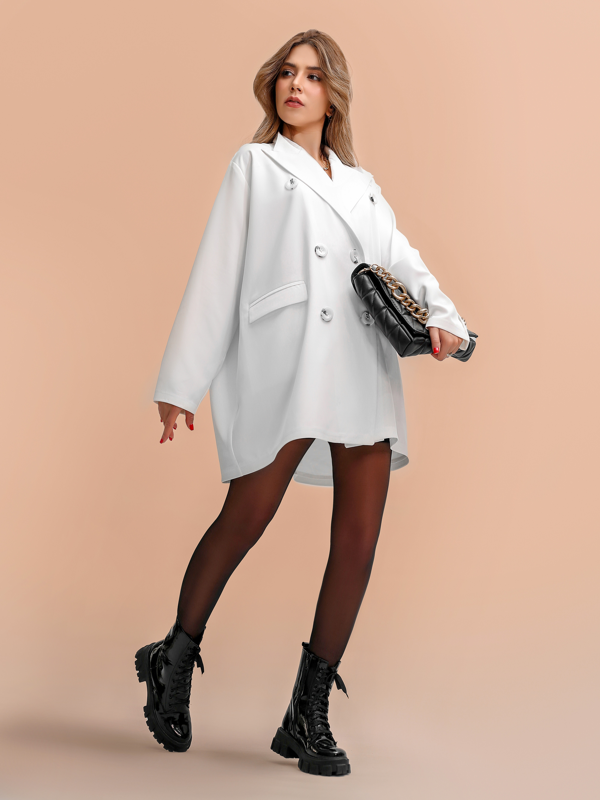

In [ ]:
image = Image.open(open(IMAGE_PATH, "rb"))
image = fix_channels(ToTensor()(image))
image = image.resize((600, 800))
image

In [ ]:
inputs = feature_extractor(images=image, return_tensors="pt")
outputs = model(**inputs)

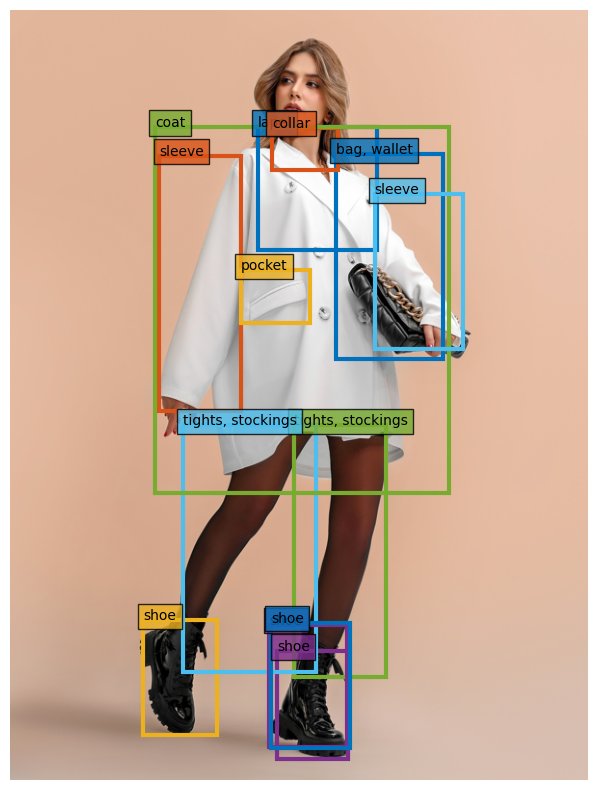

<Figure size 640x480 with 0 Axes>

In [ ]:
img = visualize_predictions(image, outputs, threshold=0.5)
img

## Example 2

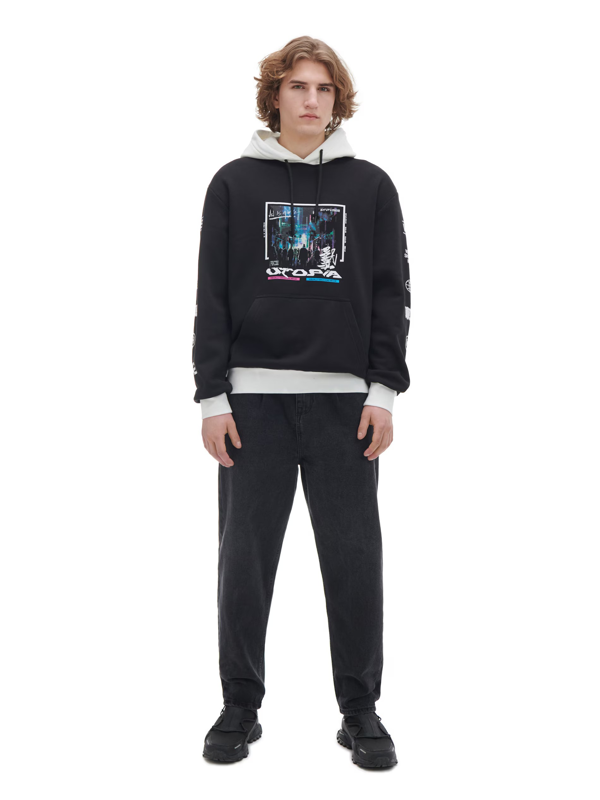

In [ ]:
image = Image.open(open("fash1.jpg", "rb"))
image = fix_channels(ToTensor()(image))
image = image.resize((600, 800))
image

In [ ]:
inputs = feature_extractor(images=image, return_tensors="pt")
outputs = model(**inputs)

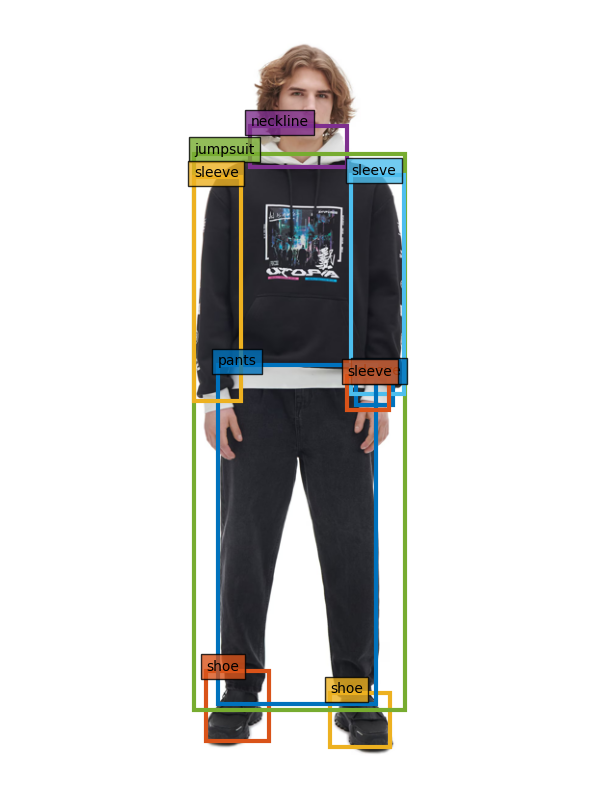

<Figure size 640x480 with 0 Axes>

In [ ]:
img = visualize_predictions(image, outputs, threshold=0.5)
img

## Example 3

In [ ]:
image = Image.open(open("fash2.jpg", "rb"))
image = fix_channels(ToTensor()(image))
image = image.resize((600, 800))

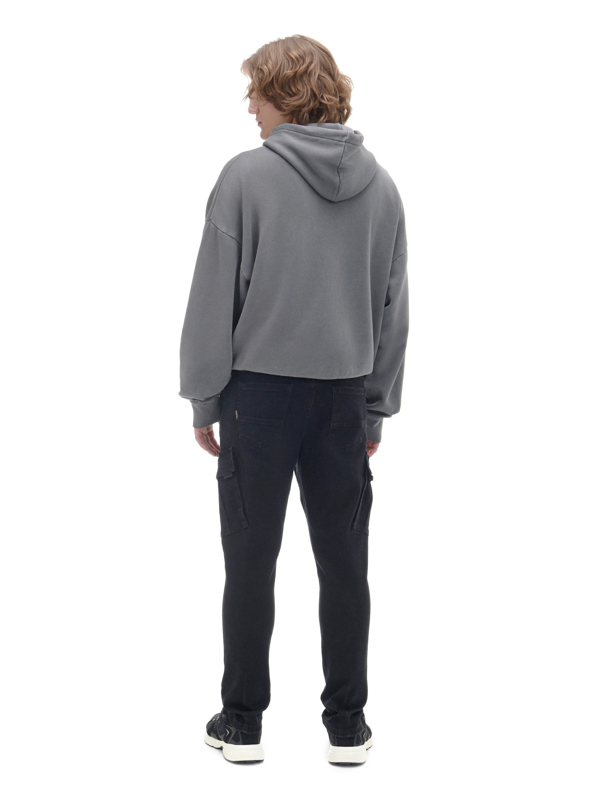

In [30]:
image

In [ ]:
inputs = feature_extractor(images=image, return_tensors="pt")
outputs = model(**inputs)

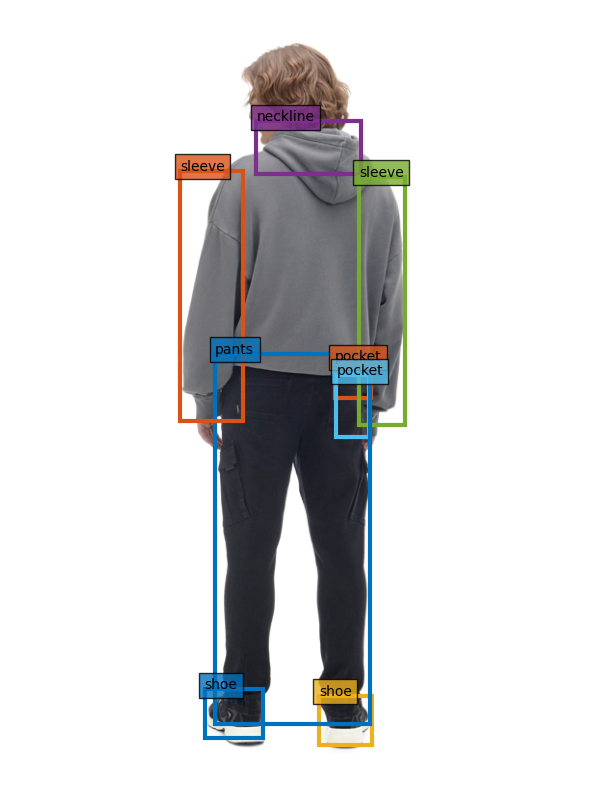

<Figure size 640x480 with 0 Axes>

In [ ]:
img = visualize_predictions(image, outputs, threshold=0.5)
img

## Example 4

In [ ]:
image = Image.open(open("fash3.jpg", "rb"))
image = fix_channels(ToTensor()(image))

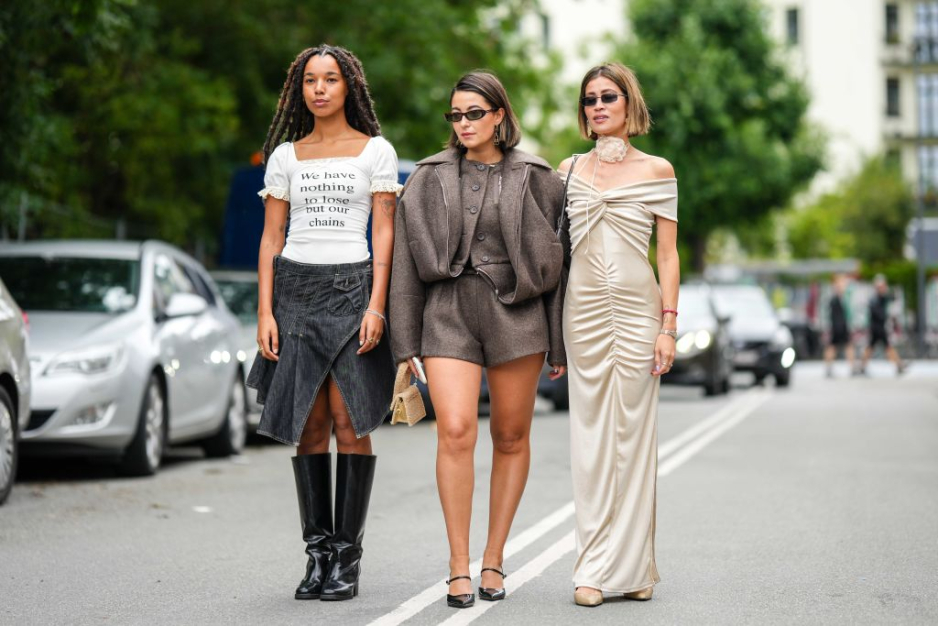

In [31]:
image

In [ ]:
inputs = feature_extractor(images=image, return_tensors="pt").to("cuda")
outputs = model(**inputs)

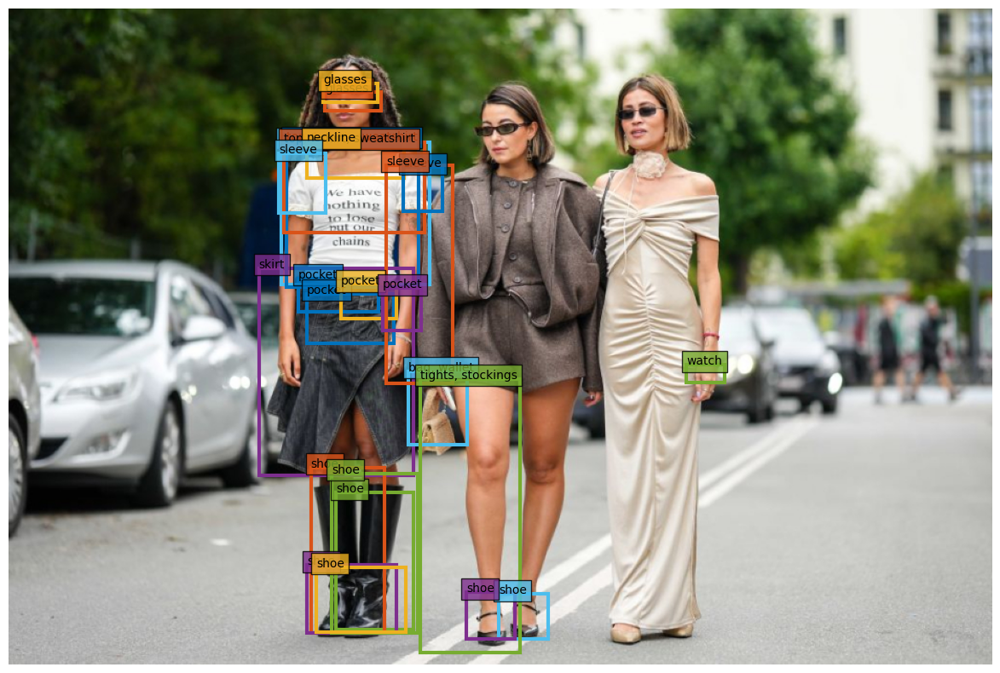

<Figure size 640x480 with 0 Axes>

In [ ]:
img = visualize_predictions(image, outputs, threshold=0.3)
img

The model properly detects all pieces of clothes for the leftmost person, while the clothes of the remaining two are mostly ignored.

## Example 5

In [12]:
image = Image.open(open("fash4.jpg", "rb"))
image = fix_channels(ToTensor()(image))
#image = image.resize((600, 800))

In [14]:
inputs = feature_extractor(images=image, return_tensors="pt").to("cuda")
outputs = model(**inputs)

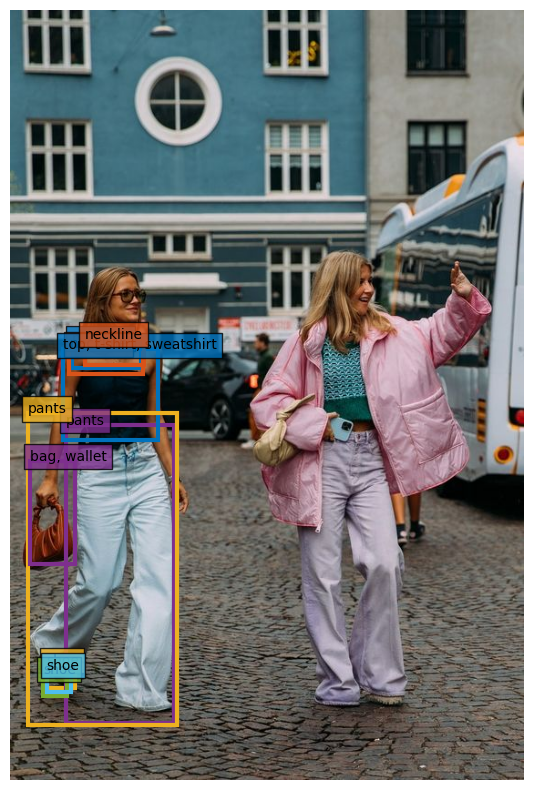

<Figure size 640x480 with 0 Axes>

In [15]:
img = visualize_predictions(image, outputs, threshold=0.5)
img

Same conlcustions can be made. Only clothes of the leftmost person are detected.

## Example 5.1. (Cropped)

We crop the previous image so that only the rightmost person is present in the picture.

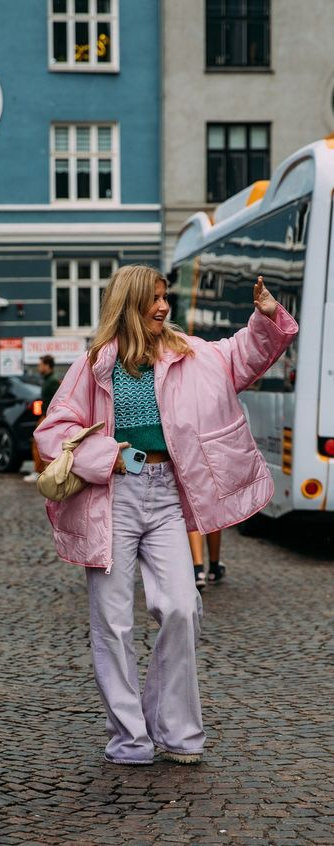

In [33]:
img5 = image.crop([230,0,564,846])
img5

In [16]:
inputs = feature_extractor(images=img5, return_tensors="pt").to("cuda")
outputs = model(**inputs)

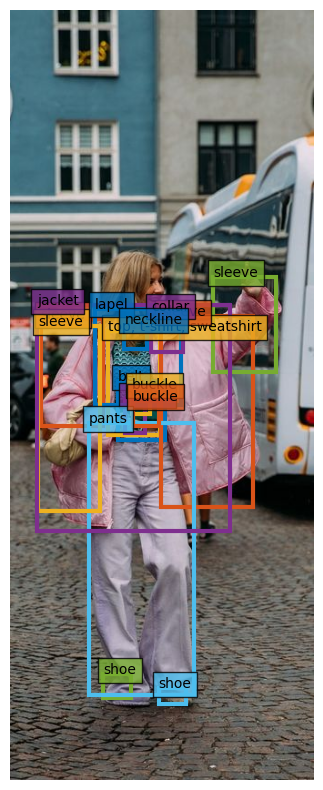

<Figure size 640x480 with 0 Axes>

In [17]:
img = visualize_predictions(img5, outputs, threshold=0.5)
img

The model manages to detect clothes of this person when she is alone in the picture. Therefore, it can be concluded that issues met in Examples 4,5 are not caused by the complexity of peoples' clothes.

In [ ]:
imgl = Image.open('fash4_res.png')
imgr = Image.open('fash5_res.png')

In [ ]:
imgl.size,imgr.size

((533, 790), (323, 790))

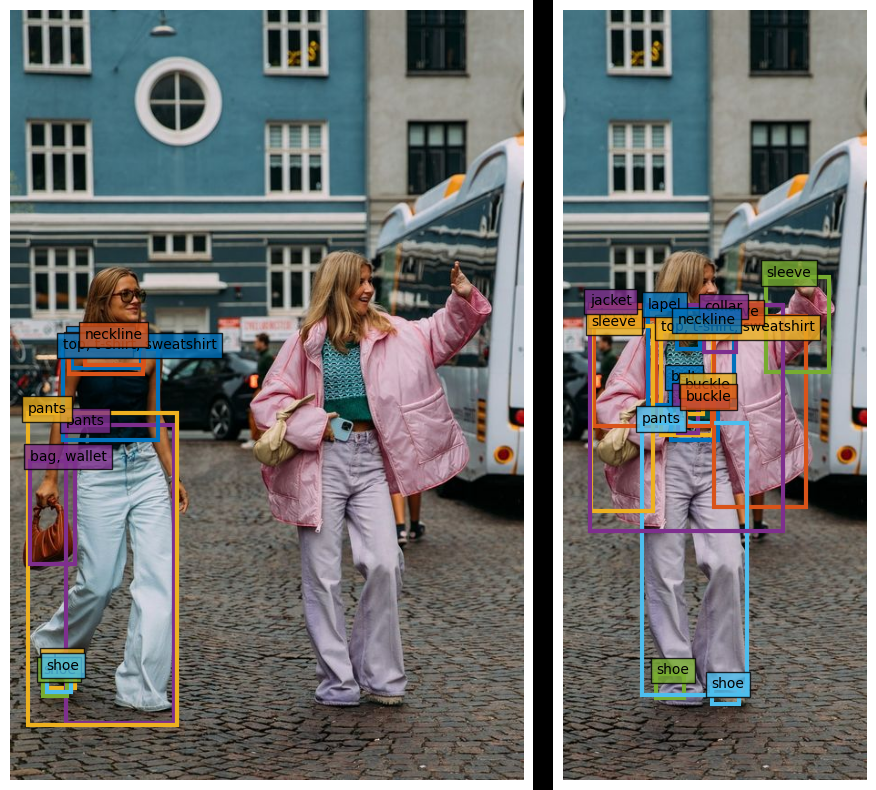

In [ ]:
grid = Image.new('RGB',[533+20+323,790])
grid.paste(imgl,[0,0])
grid.paste(imgr,[533+20,0])
grid

## Example 5.2 (Flipped)

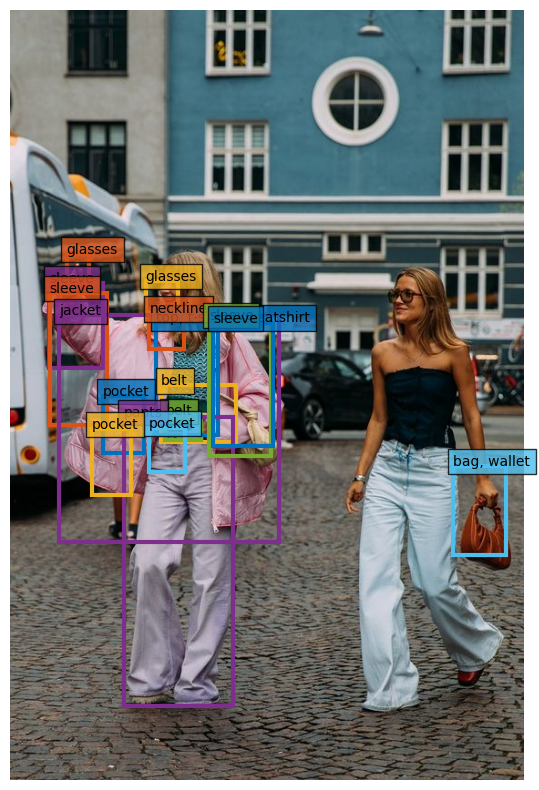

<Figure size 640x480 with 0 Axes>

In [35]:
image_flipped = image.transpose(Image.FLIP_LEFT_RIGHT)
inputs = feature_extractor(images=image_flipped, return_tensors="pt").to("cuda")
outputs = model(**inputs)
img = visualize_predictions(image_flipped, outputs, threshold=0.5)
img

## Example 5.3 (Resized)

Issues of non-detected clothes in pictures with 2+ people are most likely caused by peoples' locations within the image (only leftmost detected properly). It may be connected to the scale of the picture, therefore we want to test the resized version of the images.

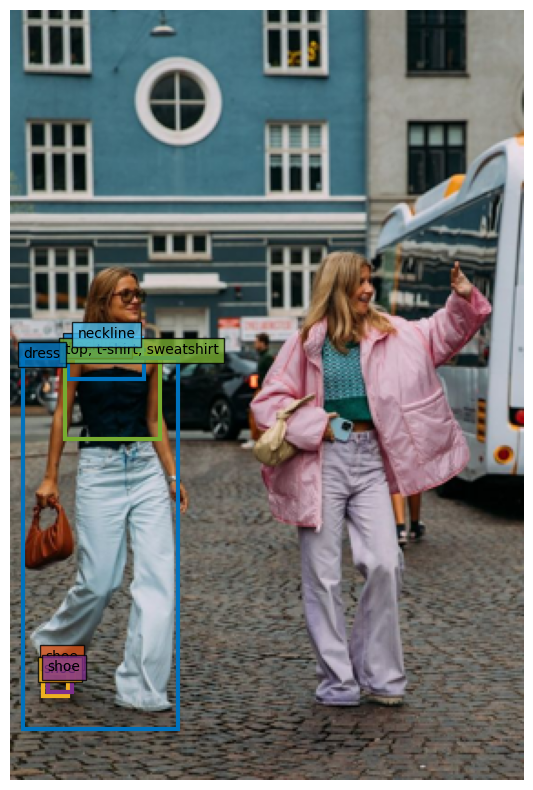

<Figure size 640x480 with 0 Axes>

In [27]:
# cut dimensions by half
image_resized = image.resize([int(f*0.5) for f in image.size])
inputs = feature_extractor(images=image_resized, return_tensors="pt").to("cuda")
outputs = model(**inputs)
img = visualize_predictions(image_resized, outputs, threshold=0.5)
img

The detection performance didn't change after cutting the image's dimensions by half

## Example 5.4 (Cropped)

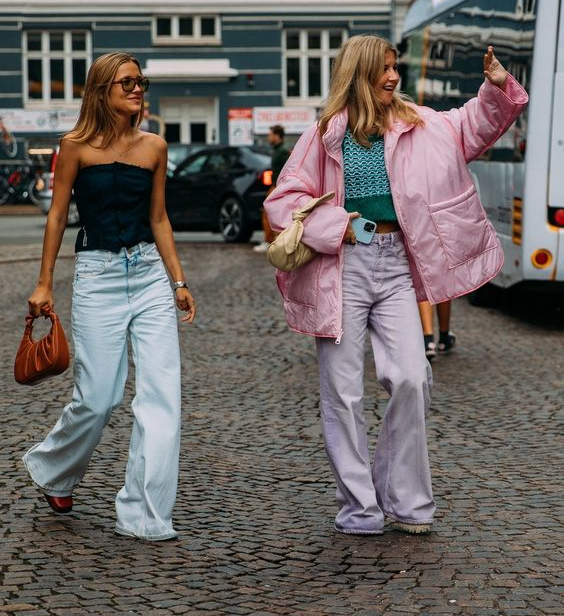

In [37]:
img54 = image.crop([0,230,564,846])
img54

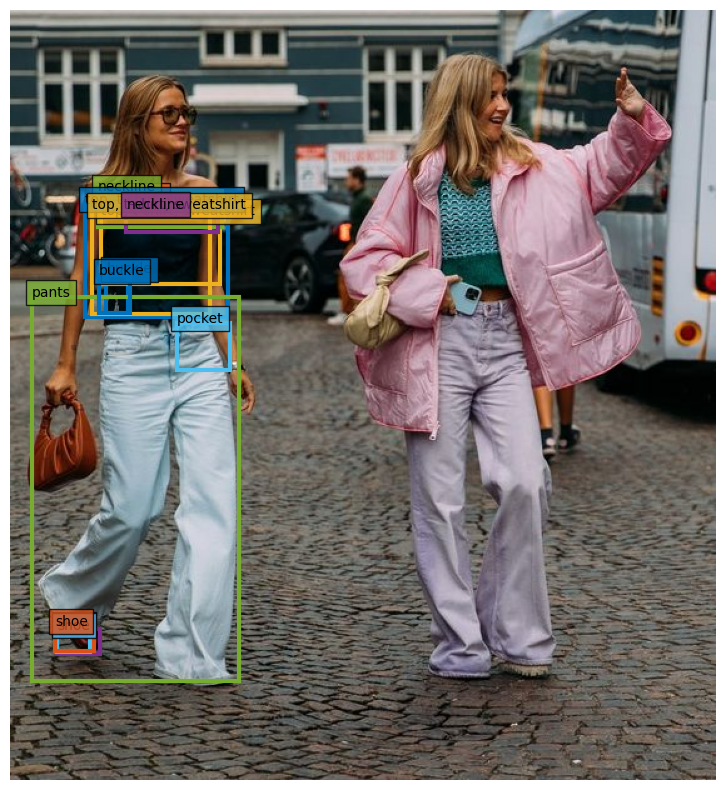

<Figure size 640x480 with 0 Axes>

In [38]:
inputs = feature_extractor(images=img54, return_tensors="pt").to("cuda")
outputs = model(**inputs)
img = visualize_predictions(img54, outputs, threshold=0.5)
img

## Example 5.5. Testing thresholds

In [39]:
inputs = feature_extractor(images=image, return_tensors="pt").to("cuda")
outputs = model(**inputs)

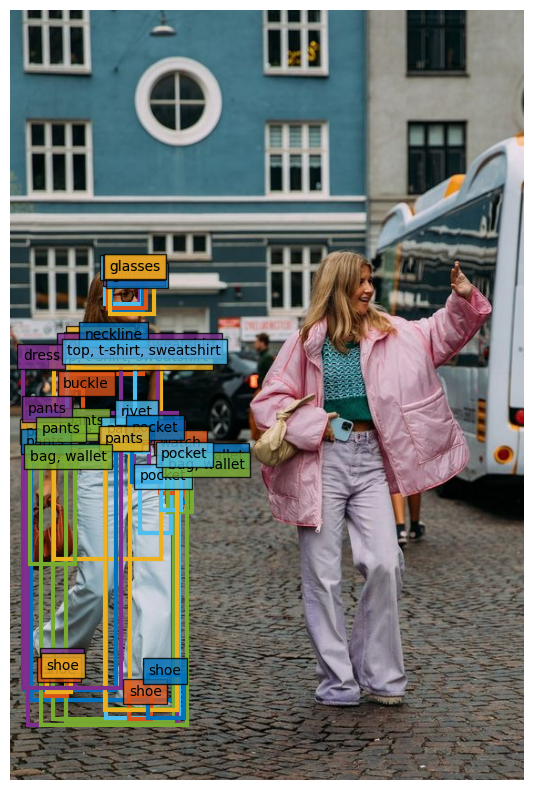

<Figure size 640x480 with 0 Axes>

In [50]:
visualize_predictions(image, outputs, threshold=0.1)

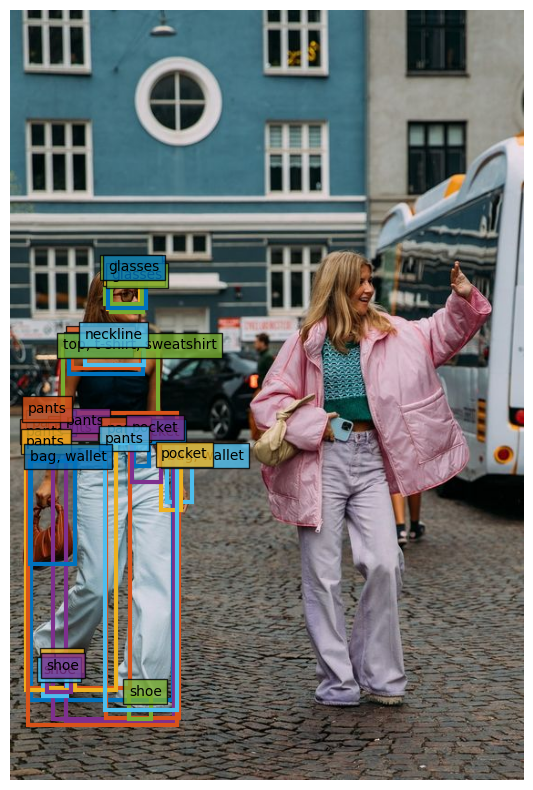

<Figure size 640x480 with 0 Axes>

In [45]:
visualize_predictions(image, outputs, threshold=0.2)

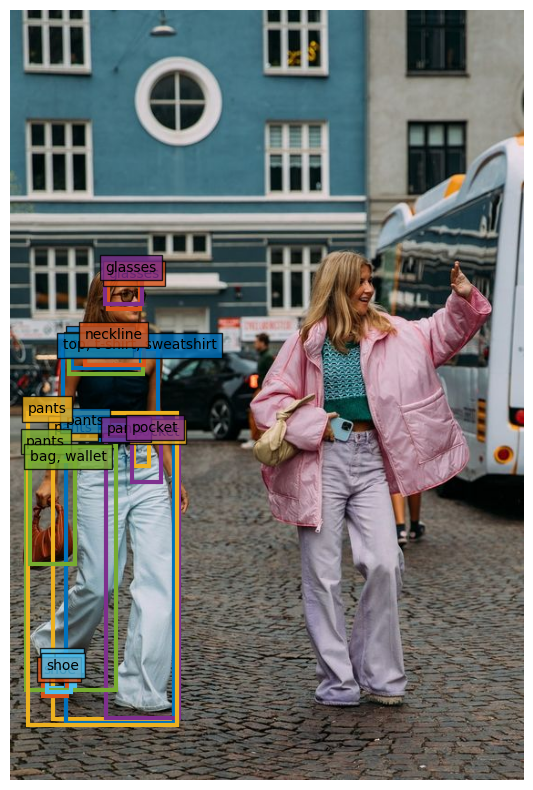

<Figure size 640x480 with 0 Axes>

In [46]:
visualize_predictions(image, outputs, threshold=0.3)

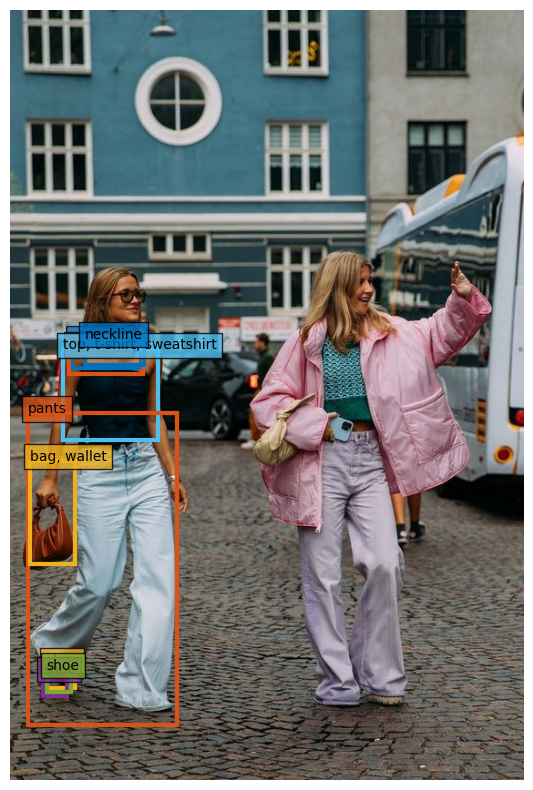

<Figure size 640x480 with 0 Axes>

In [47]:
visualize_predictions(image, outputs, threshold=0.6)

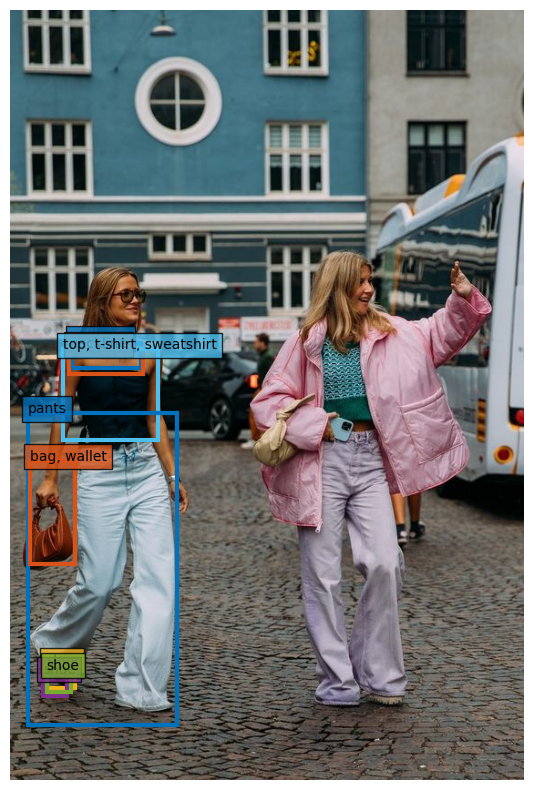

<Figure size 640x480 with 0 Axes>

In [48]:
visualize_predictions(image, outputs, threshold=0.7)

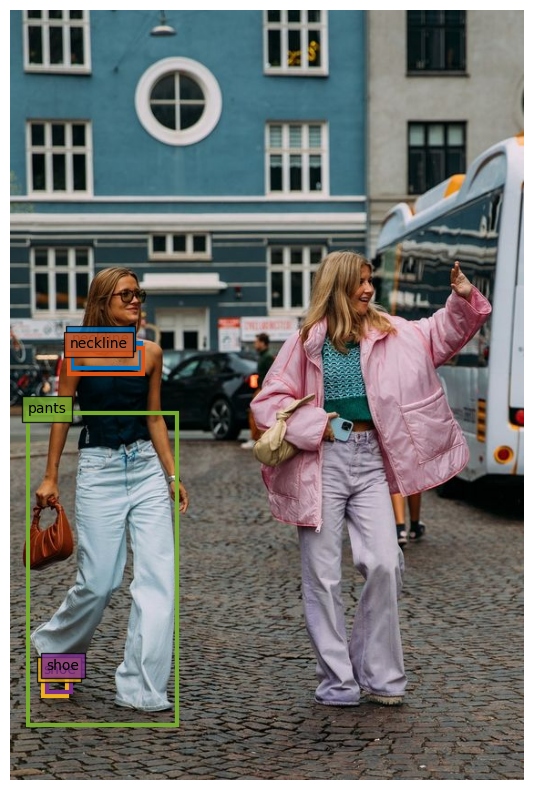

<Figure size 640x480 with 0 Axes>

In [49]:
visualize_predictions(image, outputs, threshold=0.8)

It can be concluded, that the Fashionpedia-finetuned YOLOS-Small model should only be used on images that depict one person. Otherwise, only clothes of the leftmost person would be detected.